# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1

## Students:
- Pietro Tellarini - pietro.tellarini2@studio.unibo.it - 0001145761
- Giorgia Bravi - giorgia.bravi2@studio.unibo.it - 0001143630

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
	Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
	Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

## Import libraries

In [260]:
import os
import cv2
import numpy as np
import pandas as pd
from typing import List
from collections import defaultdict
from matplotlib import pyplot as plt
from dataclasses import dataclass

Image Model -- dtype: uint8, shape: (747, 66, 3)
Image Scenes -- dtype: uint8, shape: (640, 640, 3)


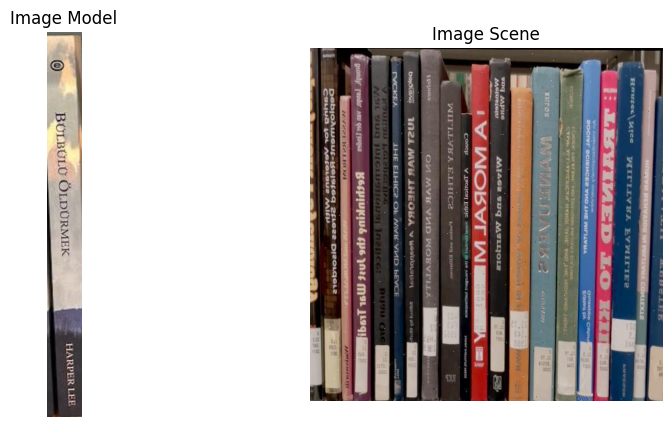

In [261]:
image_model = cv2.imread("./dataset/models/model_0.png")
image_scenes = cv2.imread("./dataset/scenes/scene_0.jpg")

#print datatype and shape of images
print(f"Image Model -- dtype: {image_model.dtype}, shape: {image_model.shape}")
print(f"Image Scenes -- dtype: {image_scenes.dtype}, shape: {image_scenes.shape}")

# show model and scene side by side (use RGB versions for correct colors)
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv2.cvtColor(image_model, cv2.COLOR_BGR2RGB))
ax[0].set_title("Image Model")
ax[0].axis("off")

ax[1].imshow(cv2.cvtColor(image_scenes, cv2.COLOR_BGR2RGB))
ax[1].set_title("Image Scene")
ax[1].axis("off")

plt.show()


### Smoothing filters

In [262]:
def convert_to_grayscale(img):
	"""Converte l'immagine in scala di grigi se è a colori."""
	return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def apply_identity(img):
	"""Restituisce l'immagine senza modifiche."""
	return img

def apply_gaussian(img, ksize=(5, 5), sigma=1):
	"""Applica un filtro Gaussiano."""
	return cv2.GaussianBlur(img, ksize, sigma)

def apply_bilateral(img, d=5, sigma_color=75, sigma_space=75):
	"""Applica un filtro Bilaterale (mantiene i bordi smussando il rumore)."""
	return cv2.bilateralFilter(img, d, sigma_color, sigma_space)

def apply_median(img, ksize=5):
	"""Applica un filtro Mediano. Gestisce ksize affinché sia dispari >= 3."""
	k = int(ksize)
	if k % 2 == 0:
		k += 1
	k = max(3, k)
	return cv2.medianBlur(img, k)

def apply_mean(img, ksize=5):
	"""Applica un filtro di media (box filter) personalizzato."""
	k = int(ksize)
	k = max(1, k)
	kernel = np.ones((k, k), np.float32) / (k * k)
	return cv2.filter2D(img, -1, kernel)


### Features Extractions filters

In [263]:

def apply_sobel(img, ksize=3, scale=1, delta=0):
	"""
	Applica il filtro Sobel combinando i gradienti X e Y.
	Restituisce la magnitudo del gradiente normalizzata a uint8.
	"""
	grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize, scale=scale, delta=delta)
	grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize, scale=scale, delta=delta)
	
	gradient_magnitude = cv2.magnitude(grad_x, grad_y)
	sobel_norm = cv2.convertScaleAbs(gradient_magnitude)
	return sobel_norm

# CUSTOM FILTER (non standard OpenCV, ma utili per evidenziare i bordi in modo più chiaro)
def apply_sobel_blend(img, ksize=3, scale=1, delta=0, alpha=0.7, beta=0.3):
	"""
	Calcola il Sobel e lo fonde con l'immagine originale.
	Utile per evidenziare i bordi mantenendo il contesto.
	"""
	sobel_norm = apply_sobel(img=img)
	# alpha: peso immagine originale, beta: peso bordi sobel
	blended = cv2.addWeighted(img, alpha, sobel_norm, beta, 0)
	return blended

def apply_canny(img, threshold1=100, threshold2=200):
	"""
	Applica il Canny Edge Detector.
	threshold1: soglia minima (isteresi).
	threshold2: soglia massima (isteresi).
	Restituisce un'immagine binaria (bordi bianchi su sfondo nero).
	"""
	# Canny funziona meglio se l'immagine è in scala di grigi, 
	# ma cv2.Canny gestisce anche BGR (usando intensità interna).
	return cv2.Canny(img, threshold1, threshold2)

def apply_log(img, ksize_gauss=3, ksize_laplace=3):
	"""
	Applica il filtro Laplacian of Gaussian (LoG).
	1. Applica una sfocatura Gaussiana per ridurre il rumore.
	2. Applica il Laplaciano per trovare i bordi (derivata seconda).
	"""
	# 1. Gaussian Blur (per ridurre la sensibilità al rumore del Laplaciano)
	# ksize deve essere dispari
	blurred = cv2.GaussianBlur(img, (ksize_gauss, ksize_gauss), 0)
	
	# 2. Laplacian
	# Usiamo CV_64F per gestire valori negativi (pendenze discendenti)
	laplacian = cv2.Laplacian(blurred, cv2.CV_64F, ksize=ksize_laplace)
	
	# 3. Conversione in uint8 (valore assoluto) per visualizzazione corretta
	log_norm = cv2.convertScaleAbs(laplacian)
	
	return log_norm


### Enhancement Filters

In [264]:

def clahe_equalization(img, clip_limit=2.0, tile_grid_size=(8,8)):
	"""
	Applica CLAHE (Contrast Limited Adaptive Histogram Equalization) su un'immagine in scala di grigi.
	"""
	clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
	if len(img.shape) == 2:
		# Immagine già in scala di grigi
		return clahe.apply(img)
	else:
		# Immagine a colori BGR
		# Convertiamo in LAB: L=Luminosità, A e B sono i canali colore
		lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
		l, a, b = cv2.split(lab)
		
		# Applichiamo CLAHE solo alla luminosità
		l_enhanced = clahe.apply(l)
		
		# Uniamo di nuovo i canali e torniamo in BGR
		enhanced_lab = cv2.merge((l_enhanced, a, b))
		return cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)

def unsharp_mask(gray):
	gaussian = cv2.GaussianBlur(gray, (0, 0), 2.0)
	gray = cv2.addWeighted(gray, 1.5, gaussian, -0.5, 0)
	
	return gray

def guided_sharpening(gray, radius=5, eps=1e-2, amount=1.0):
	"""
	Usa il Guided Filter per fare sharpening invece del Gaussiano.
	"""
	smooth = cv2.ximgproc.guidedFilter(guide=gray, src=gray, radius=radius, eps=eps)
	sharpened = cv2.addWeighted(gray, 1.0 + amount, smooth, -amount, 0)
	return sharpened

In [265]:
FILTER_MAP = {
	"original": apply_identity,
	"gaussian": apply_gaussian,
	"bilateral": apply_bilateral,
	"median": apply_median,
	"mean": apply_mean,
	"sobel_blend": apply_sobel_blend,
}

ENHANCE_MAP = {
	"clahe": clahe_equalization,
	"unsharp": unsharp_mask,
	"guided_sharpen": guided_sharpening,
}

EDGE_MAP = {
	"sobel": apply_sobel,
	"canny": apply_canny,
	"log": apply_log,
}

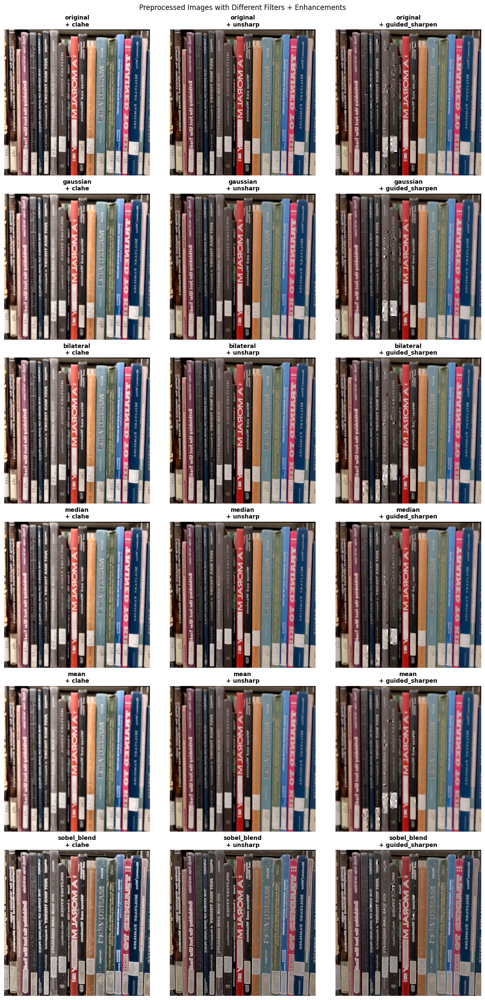

In [266]:
n_rows = len(FILTER_MAP)
n_cols = len(ENHANCE_MAP)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows), constrained_layout=True)

for r, (f_name, f_func) in enumerate(FILTER_MAP.items()):
	base_img = f_func(image_scenes)
	for c, (e_name, e_func) in enumerate(ENHANCE_MAP.items()):
		# Step 2: Applica l'enhancement (Contrast/Sharpening)
		final_img = e_func(base_img)
		
		# Conversione per Matplotlib
		final_rgb = cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB)
		
		ax = axes[r, c] if n_rows > 1 else axes[c]
		ax.imshow(final_rgb)
		
		# Titolo composto: Filtro -> Enhancement
		ax.set_title(f"{f_name}\n+ {e_name}", fontsize=10, fontweight='bold')
		ax.axis("off")

plt.suptitle("Preprocessed Images with Different Filters + Enhancements")
plt.show()


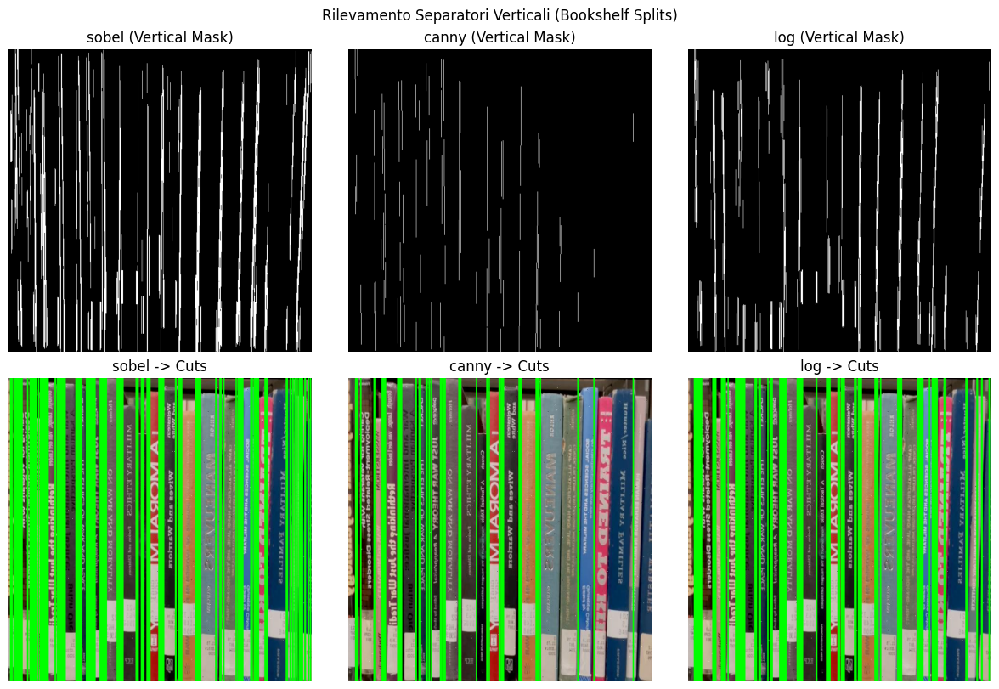

In [267]:
def extract_vertical_lines(img_edges, kernel_len=30):
	"""
	Prende in input una mappa di bordi (da Canny, Sobel, LoG, ecc.)
	e restituisce un'immagine con SOLO le linee verticali lunghe.
	"""
	# Se l'immagine non è binaria, la binarizziamo
	if len(img_edges.shape) == 3:
		img_edges = cv2.cvtColor(img_edges, cv2.COLOR_BGR2GRAY)
	
	# Binarizzazione otsu per sicurezza (se arriva da Sobel/LoG)
	_, binary = cv2.threshold(img_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

	# --- IL TRUCCO ---
	# Creiamo un kernel che è una linea verticale alta (es. 1x30 pixel).
	# Qualsiasi cosa più piccola di 30px o orizzontale verrà cancellata.
	vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_len))
	
	# Morphological OPEN: Erosione seguita da Dilatazione.
	# Rimuove il rumore e le linee orizzontali.
	detected_verticals = cv2.morphologyEx(binary, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
	
	return detected_verticals

def draw_hough_lines(canvas, vertical_mask):
	"""
	Trova le coordinate delle linee sulla maschera verticale e le disegna
	estendendole su tutta l'altezza per simulare il 'taglio'.
	"""
	# HoughLinesP trova segmenti di linea probabilistici
	lines = cv2.HoughLinesP(vertical_mask, 1, np.pi / 180, threshold=50, minLineLength=50, maxLineGap=10)
	
	output = canvas.copy()
	if lines is not None:
		for line in lines:
			x1, y1, x2, y2 = line[0]
			# Disegna una linea verde verticale che copre tutta l'altezza dell'immagine
			# Usiamo la media delle X per centrare la linea verticale
			x_avg = (x1 + x2) // 2
			height = canvas.shape[0]
			cv2.line(output, (x_avg, 0), (x_avg, height), (0, 255, 0), 2)
	return output

n = len(EDGE_MAP)
fig, axes = plt.subplots(2, n, figsize=(4 * n, 8), constrained_layout=True)

for i, (ftype, ffunc) in enumerate(EDGE_MAP.items()):
	# 1. Preparazione
	image_input = cv2.cvtColor(image_scenes, cv2.COLOR_BGR2RGB)
	
	# 2. Applicazione Filtro Bordi (Canny, Sobel, ecc.)
	filtered_image = ffunc(image_input)
	
	# Equalizzazione (aiuta a far emergere i bordi deboli)
	enhanced_image = clahe_equalization(filtered_image)

	# 3. ESTRAZIONE LINEE zVERTICALI (Step 1: Maschera)
	# kernel_len=30 significa che la linea deve essere alta almeno 30px per essere considerata
	vertical_mask = extract_vertical_lines(enhanced_image, kernel_len=30)
	
	# 4. DISEGNO LINEE DI TAGLIO (Step 2: Hough)
	# Disegniamo le linee sull'immagine originale per vedere dove taglierebbe
	lines_visualization = draw_hough_lines(image_input, vertical_mask)

	# --- VISUALIZZAZIONE ---
	if n > 1:
		ax_top = axes[0, i]
		ax_bot = axes[1, i]
	else:
		ax_top = axes[0]
		ax_bot = axes[1]

	# Riga 1: La maschera delle sole linee verticali isolate
	ax_top.imshow(vertical_mask, cmap='gray')
	ax_top.set_title(f"{ftype} (Vertical Mask)")
	ax_top.axis("off")

	# Riga 2: Le linee di taglio sovrapposte all'immagine originale
	ax_bot.imshow(lines_visualization)
	ax_bot.set_title(f"{ftype} -> Cuts")
	ax_bot.axis("off")

plt.suptitle("Rilevamento Separatori Verticali (Bookshelf Splits)")
plt.show()

### SIFT Keypoint Detection and Description

In [268]:
def extract_sift_features(gray_img, nfeatures=None):
	"""
	Estrai keypoints e descrittori SIFT
	"""
	# SIFT con limite di features (performance)
	sift = cv2.SIFT_create(nfeatures=nfeatures)
	
	# Detect + Compute in un colpo solo
	keypoints, descriptors = sift.detectAndCompute(gray_img, None)
	
	return keypoints, descriptors

### Testing different Preprocessing Pipelines for Keypoint Detection

In [269]:
# Filtri da testare
filters_config = {
	"Original Grayscale": {
		"func": lambda img: img,
		"description": "No filter, direct grayscale"
	},
	"Bilateral": {
		"func": lambda img: apply_bilateral(img),
		"description": "Bilateral filter"
	},
	"Sobel Blend": {
		"func": lambda img: apply_sobel_blend(img),
		"description": "Sobel blended with original (ksize=3)"
	},
	"Grayscale (CLAHE)" : {
		"func": lambda img: clahe_equalization(
			img),
		"description": "CLAHE histogram equalization"
	},
	"Bilateral (CLAHE)": {
		"func": lambda img: clahe_equalization(
			apply_bilateral(img)),
		"description": "Bilateral filter + CLAHE histogram equalization"
	},
	"Sobel Blend (CLAHE)": {
		"func": lambda img: clahe_equalization(
			apply_sobel_blend(img)),
		"description": "cv2.Sobel blended + CLAHE histogram equalization"
	},
	"Grayscale (CLAHE) [Sharp]": {
		"func": lambda img: unsharp_mask(clahe_equalization(img)),
		"description": "CLAHE histogram equalization + Unsharp Mask"
	},
	"Bilateral (CLAHE) [Sharp]": {
		"func": lambda img: unsharp_mask(clahe_equalization(
			apply_bilateral(img))),
		"description": "Bilateral filter + CLAHE histogram equalization"
	},
	"Sobel Blend (CLAHE) [Sharp]": {
		"func": lambda img: unsharp_mask(clahe_equalization(
			apply_sobel_blend(img))
		),
		"description": "cv2.Sobel blended + CLAHE histogram equalization"
	}
}

In [270]:
def analyze_filters_on_dataset(models_path="./dataset/models", 
								scenes_path="./dataset/models",
								max_dim=1000):
	"""
	Analizza l'impatto di diversi filtri su tutte le scene del dataset.
	
	Returns:
		DataFrame con statistiche per ogni filtro
	"""
	
	
	valid_exts = [".png", ".jpg", ".jpeg", ".bmp"]
	
	# Struttura per salvare risultati
	results = defaultdict(lambda: {
		'keypoints_per_image': [],
		'descriptor_stats': [],               
		'total_keypoints': 0,
		'num_images': 0,
		'min_keypoints': float('inf'),
		'max_keypoints': 0,
		'scene_stats': defaultdict(lambda: {
			'keypoints': [], 
			'descriptor_mean': [],           
			'descriptor_variance': [],       
			'descriptor_entropy': []         
		})
	})
	
	
	# Carica tutte le scene
	scene_files = sorted([f for f in os.listdir(scenes_path) 
						 if os.path.splitext(f)[1].lower() in valid_exts])

	
	# Analizza ogni combinazione filtro-scena
	for scene_file in scene_files:
		scene_path = os.path.join(scenes_path, scene_file)
		img_bgr = cv2.imread(scene_path)
		
		if img_bgr is None:
			print(f"Skipping {scene_file} (failed to load)")
			continue
		
		for filter_name, filter_config in filters_config.items():
			try:
				# Applica filtro
				gray_filtered = filter_config['func'](img_bgr)
				
				# Estrai keypoints
				keypoints, descriptors = extract_sift_features(gray_filtered, nfeatures=15000)
				num_kp = len(keypoints)

				if descriptors is not None and len(descriptors) > 0:
					# Media valori (intensità media feature)
					desc_mean = float(np.mean(descriptors))
					
					# Varianza (diversità tra descrittori)
					desc_variance = float(np.var(descriptors))
					
					# Entropia (distintività - più alto = più unici)
					desc_flat = descriptors.flatten()
					hist, _ = np.histogram(desc_flat, bins=256, range=(0, 256), density=True)
					hist = hist[hist > 0]  # Rimuovi bins vuoti
					desc_entropy = float(-np.sum(hist * np.log2(hist))) if len(hist) > 0 else 0.0
					
					# Sparsity (% valori bassi)
					sparsity = float(np.mean(descriptors < 10))
				else:
					desc_mean = desc_variance = desc_entropy = sparsity = 0.0
				
				# Aggiorna statistiche
				results[filter_name]['keypoints_per_image'].append(num_kp)
				results[filter_name]['total_keypoints'] += num_kp
				results[filter_name]['num_images'] += 1
				results[filter_name]['min_keypoints'] = min(
					results[filter_name]['min_keypoints'], num_kp
				)
				results[filter_name]['max_keypoints'] = max(
					results[filter_name]['max_keypoints'], num_kp
				)
				results[filter_name]['scene_stats'][scene_file]['keypoints'].append(num_kp)
				results[filter_name]['descriptor_stats'].append({
					'mean': desc_mean,
					'variance': desc_variance,
					'entropy': desc_entropy,
					'sparsity': sparsity
				})
				
			except Exception as e:
				print(f"{filter_name}: ERROR - {str(e)}")
				continue

	# Calcola statistiche finali
	summary_data = []
	
	for filter_name, stats in results.items():
		kp_array = np.array(stats['keypoints_per_image'])

		desc_stats = stats['descriptor_stats']
		if len(desc_stats) > 0:
			mean_entropy = np.mean([d['entropy'] for d in desc_stats])
			mean_variance = np.mean([d['variance'] for d in desc_stats])
			mean_sparsity = np.mean([d['sparsity'] for d in desc_stats])
		else:
			mean_entropy = mean_variance = mean_sparsity = 0.0
		summary = {
			'Filter': filter_name,
			'Mean Keypoints': np.mean(kp_array),
			'Std Dev': np.std(kp_array),
			'Median': np.median(kp_array),
			'Min': stats['min_keypoints'],
			'Max': stats['max_keypoints'],
			'Total Images': stats['num_images'],
			'Coefficient of Variation (%)': (np.std(kp_array) / np.mean(kp_array)) * 100,
			'Descriptor Entropy': mean_entropy,
			'Descriptor Variance': mean_variance,
			'Descriptor Sparsity': mean_sparsity,
			# Score combinato
			'Quality Score': np.mean(kp_array) * (mean_entropy / 8.0) if mean_entropy > 0 else 0.0
		}
		
		summary_data.append(summary)
	
	df_summary = pd.DataFrame(summary_data)
	
	return df_summary, results, filters_config


In [271]:
df_summary, results, filters_config = analyze_filters_on_dataset()
print("FILTER ANALYSIS SUMMARY:")
print(df_summary.to_string(index=False))
	

FILTER ANALYSIS SUMMARY:
                     Filter  Mean Keypoints    Std Dev  Median  Min  Max  Total Images  Coefficient of Variation (%)  Descriptor Entropy  Descriptor Variance  Descriptor Sparsity  Quality Score
         Original Grayscale      557.772727 276.674231   451.5  262 1306            22                     49.603399            5.751350          1374.458968             0.513806     400.993281
                  Bilateral      406.454545 202.276078   348.0  154  968            22                     49.765977            5.662920          1380.402005             0.520565     287.714937
                Sobel Blend      418.727273 292.431217   322.5   96 1255            22                     69.838111            5.880878          1328.547397             0.475496     307.810506
          Grayscale (CLAHE)      835.272727 421.142297   662.5  349 1983            22                     50.419735            5.871632          1350.148182             0.487380     613.051786
     

In [272]:
def plot_filter_comparison(df_summary, results, save_path=None):
	"""
	Genera grafici di confronto tra i filtri
	"""
	
	fig, axes = plt.subplots(3, 3, figsize=(20, 15))
	fig.suptitle('Filter Performance: Keypoints + Descriptor Quality', 
				 fontsize=16, fontweight='bold')
	
	filters = df_summary['Filter'].tolist()
	colors = plt.cm.Set3(np.linspace(0, 1, len(filters)))
	
	### 1 Bar chart: Mean keypoints
	ax1 = axes[0, 0]
	bars = ax1.bar(filters, df_summary['Mean Keypoints'], color=colors, alpha=0.8, edgecolor='black')
	ax1.set_ylabel('Mean Keypoints', fontweight='bold')
	ax1.set_title('Average Keypoints per Scene')
	ax1.set_xticks(np.arange(len(filters)))
	ax1.set_xticklabels(filters, rotation=45, ha='right')
	ax1.grid(axis='y', alpha=0.3)
	
	# Aggiungi valori sulle barre
	for bar in bars:
		height = bar.get_height()
		ax1.text(bar.get_x() + bar.get_width()/2., height,
				f'{height:.0f}',
				ha='center', va='bottom', fontsize=5)
	
	### 2 Error bars: Mean ± Std
	ax2 = axes[0, 1]
	x_pos = np.arange(len(filters))
	ax2.errorbar(x_pos, df_summary['Mean Keypoints'], 
				 yerr=df_summary['Std Dev'],
				 fmt='o', markersize=8, capsize=5, capthick=2,
				 color='steelblue', ecolor='coral', linewidth=2)
	ax2.set_xticks(x_pos)
	ax2.set_xticklabels(filters, rotation=45, ha='right')
	ax2.set_ylabel('Keypoints', fontweight='bold')
	ax2.set_title('Mean ± Standard Deviation')
	ax2.grid(True, alpha=0.3)
	
	### 3 Box plot: Distribution
	ax3 = axes[0, 2]
	data_to_plot = [results[f]['keypoints_per_image'] for f in filters]
	bp = ax3.boxplot(data_to_plot, tick_labels=filters, patch_artist=True,
					 notch=True, showmeans=True)
	
	for patch, color in zip(bp['boxes'], colors):
		patch.set_facecolor(color)
		patch.set_alpha(0.7)
	
	ax3.set_ylabel('Keypoints', fontweight='bold')
	ax3.set_title('Distribution (with median & mean)')
	ax3.set_xticks(np.arange(1, len(filters) + 1))
	ax3.set_xticklabels(filters, rotation=45, ha='right')
	ax3.grid(axis='y', alpha=0.3)
	
	### 4 Coefficient of Variation (consistency)
	ax4 = axes[1, 0]
	cv_bars = ax4.barh(filters, df_summary['Coefficient of Variation (%)'], 
					   color=colors, alpha=0.8, edgecolor='black')
	ax4.set_xlabel('Coefficient of Variation (%)', fontweight='bold')
	ax4.set_title('Consistency (Lower = More Stable)')
	ax4.grid(axis='x', alpha=0.3)
	ax4.invert_yaxis()
	
	# Aggiungi valori
	for i, (bar, cv) in enumerate(zip(cv_bars, df_summary['Coefficient of Variation (%)'])):
		ax4.text(cv + 1, i, f'{cv:.1f}%', va='center', fontsize=9)
	
	### 5 Range (Min-Max)
	ax5 = axes[1, 1]
	x_pos = np.arange(len(filters))
	ax5.scatter(x_pos, df_summary['Min'], marker='v', s=100, 
			   color='red', label='Min', zorder=3)
	ax5.scatter(x_pos, df_summary['Max'], marker='^', s=100, 
			   color='green', label='Max', zorder=3)
	ax5.vlines(x_pos, df_summary['Min'], df_summary['Max'], 
			  colors='gray', linewidth=2, alpha=0.5)
	ax5.set_xticks(x_pos)
	ax5.set_xticklabels(filters, rotation=45, ha='right')
	ax5.set_ylabel('Keypoints', fontweight='bold')
	ax5.set_title('Min-Max Range per Filter')
	ax5.legend()
	ax5.grid(True, alpha=0.3)
	
	### 6 Heatmap: Keypoints per scene
	ax6 = axes[1, 2]
	
	# Costruisci matrice scene x filtri
	scene_names = sorted(results[filters[0]]['scene_stats'].keys())
	heatmap_data = np.zeros((len(scene_names), len(filters)))
	
	for i, scene in enumerate(scene_names):
		for j, filt in enumerate(filters):
			kp_list = results[filt]['scene_stats'][scene]['keypoints']
			heatmap_data[i, j] = kp_list[0] if kp_list else 0
	
	im = ax6.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
	ax6.set_xticks(np.arange(len(filters)))
	ax6.set_yticks(np.arange(len(scene_names)))
	ax6.set_xticklabels(filters, rotation=45, ha='right', fontsize=8)
	ax6.set_yticklabels([s.replace('scene_', 'S') for s in scene_names], fontsize=8)
	ax6.set_title('Keypoints Heatmap (Scene × Filter)')
	
	# Aggiungi colorbar
	cbar = plt.colorbar(im, ax=ax6)
	cbar.set_label('Keypoints', rotation=270, labelpad=15)
	
	### Descriptor Entropy (Distintività)
	ax7 = axes[2, 0]
	bars = ax7.bar(filters, df_summary['Descriptor Entropy'], 
				   color=colors, alpha=0.8, edgecolor='black')
	ax7.set_ylabel('Entropy', fontweight='bold')
	ax7.set_title('Descriptor Distinctiveness (Higher = Better)')
	ax7.set_xticks(np.arange(len(filters)))
	ax7.set_xticklabels(filters, rotation=45, ha='right', fontsize=8)
	ax7.grid(axis='y', alpha=0.3)
	
	for bar in bars:
		height = bar.get_height()
		ax7.text(bar.get_x() + bar.get_width()/2., height,
				f'{height:.2f}', ha='center', va='bottom', fontsize=6)
	
	### Quality Score (Combinato)
	ax8 = axes[2, 1]
	bars = ax8.barh(filters, df_summary['Quality Score'], 
					color=colors, alpha=0.8, edgecolor='black')
	ax8.set_xlabel('Quality Score', fontweight='bold')
	ax8.set_title('Combined Quality (Keypoints × Entropy)')
	ax8.grid(axis='x', alpha=0.3)
	ax8.invert_yaxis()
	
	for i, (bar, score) in enumerate(zip(bars, df_summary['Quality Score'])):
		ax8.text(score + 10, i, f'{score:.0f}', va='center', fontsize=8)
	
	### Scatter: Keypoints vs Entropy
	ax9 = axes[2, 2]
	scatter = ax9.scatter(df_summary['Mean Keypoints'], 
						 df_summary['Descriptor Entropy'],
						 s=200, c=np.arange(len(filters)), 
						 cmap='Set3', alpha=0.7, edgecolors='black', linewidth=2)
	
	for i, filt in enumerate(filters):
		ax9.annotate(filt, 
					(df_summary['Mean Keypoints'].iloc[i], 
					 df_summary['Descriptor Entropy'].iloc[i]),
					fontsize=7, ha='right')
	
	ax9.set_xlabel('Mean Keypoints', fontweight='bold')
	ax9.set_ylabel('Descriptor Entropy', fontweight='bold')
	ax9.set_title('Quality Space (Top-Right = Best)')
	ax9.grid(True, alpha=0.3)
	
	# Linee di riferimento
	ax9.axhline(df_summary['Descriptor Entropy'].mean(), 
			   color='red', linestyle='--', alpha=0.5, label='Mean Entropy')
	ax9.axvline(df_summary['Mean Keypoints'].mean(), 
			   color='blue', linestyle='--', alpha=0.5, label='Mean Keypoints')
	ax9.legend(fontsize=8)
	
	plt.tight_layout()
	
	if save_path:
		plt.savefig(save_path, dpi=300, bbox_inches='tight')
		print(f"\n Plot saved to: {save_path}")

	plt.show()


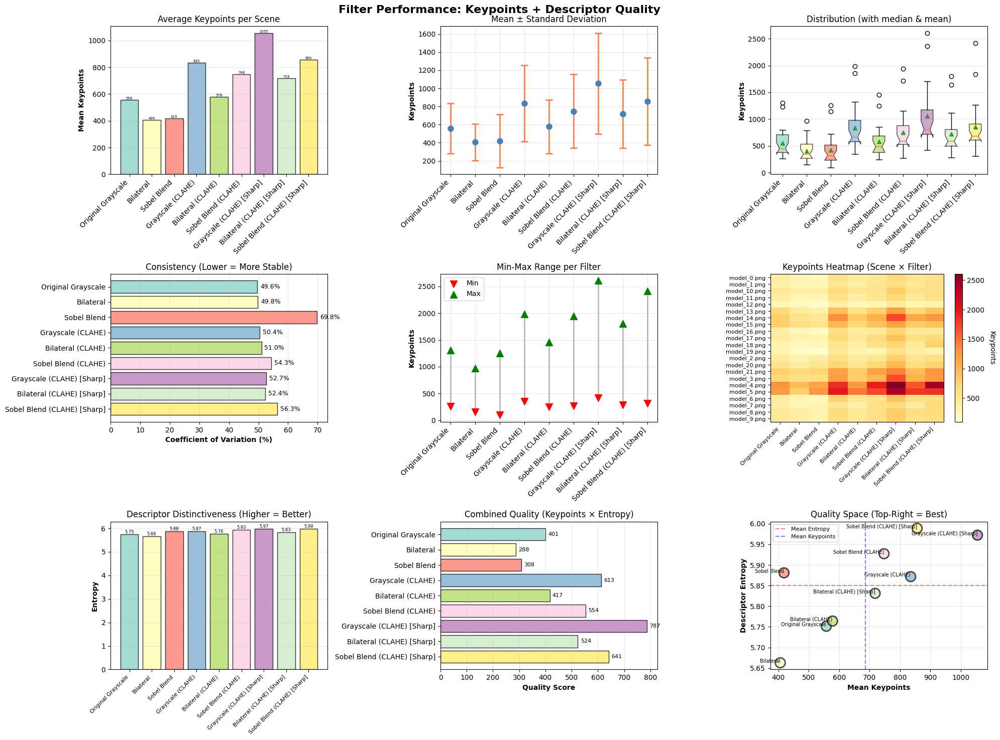

In [273]:
plot_filter_comparison(df_summary, results)

## Comparative Analysis of Filtering and Pre-processing Strategies

The objective of this testing phase was to determine the optimal pre-processing pipeline to maximize **SIFT extractor** efficacy. The goal was to find the best balance between the number of detected **Keypoints** and the quality of their **Descriptors** (measured via Entropy and Variance). Results obtained from a 30-image dataset highlight clear trends that guided our final selection.

### Discarding Smoothing Filters (Gaussian & Bilateral)

Data shows that applying low-pass or selective smoothing filters does not provide significant benefits for book recognition:

* **Bilateral Filter:** This proved to be the worst-performing strategy, drastically reducing the average keypoint count and yielding the lowest **Quality Score**. Its "edge-preserving" nature oversimplifies the fine textures of book titles, removing crucial information required by SIFT.

* **Gaussian Filter:** While maintaining a keypoint count similar to the original, it fails to address lighting issues and tends to blur the high-frequency details necessary to distinguish thin typography on book spines.

### The Winning Duo: CLAHE and Unsharp Masking

The introduction of **CLAHE** (Contrast Limited Adaptive Histogram Equalization) was the primary turning point in performance:

* **Quantitative Boost:** Moving from standard Grayscale to **Grayscale + CLAHE** increased average keypoints by **34%** and significantly lowered the **Coefficient of Variation**, indicating much higher stability across different lighting conditions.

* **Acutance via Unsharp Masking:** Combining CLAHE with **Unsharp Masking** further elevated the Quality Score. This filter increases the acutance of text edges, allowing SIFT to assign more precise and stable gradient orientations.

### Should we use Sobel-Blend Filter?

While combinations involving **Sobel Blend** (specifically *Sobel Blend (CLAHE) + Unsharp*) achieved the highest Quality Score, a critical analysis suggests caution:

* **Macroscopic Bias:** Sobel filters artificially emphasize linear edges. In a library setting, this risks prioritizing the straight lines of shelves and book corners over the unique details of the titles themselves.

* **Artifacts and Sparsity:** Sobel filters exhibited the lowest **Descriptor Sparsity**. This suggests that the detected points are overly clustered or redundant along edges, potentially "merging" characters in dense text and creating descriptors that no longer match the clean reference templates.

### Conclusion and Final Configuration

Despite the higher raw keypoint counts provided by the Sobel Blend, the **Grayscale (CLAHE) + Unsharp** pipeline was chosen as the most robust solution for title and cover recognition.

This configuration provides an excellent equilibrium:

1. **High Keypoint Density (3728):** More than sufficient for robust homography estimation.
2. **Descriptor Fidelity:** Preserves the original morphology of characters without introducing synthetic gradients.
3. **Stability (CoV 21.6%):** Ensures the system remains reliable regardless of external geometric edges.

By integrating shadow recovery via **CLAHE** and typographic enhancement via **Unsharp Masking**, we maintain a clean signal that preserves the integrity of textual characters while avoiding the synthetic artifacts of gradient-based filters.

---

# Books Recognition System - Final Pinpline 

### Configuration Parameters
The final configuration parameters for the Book Recognition System have been carefully selected based on extensive testing and analysis. Below is a detailed explanation of each parameter and its intended effect on the system's performance.

#### Feature Extraction (SIFT/AKAZE) we are using SIFT since it performed better in the testings.

* **`nfeatures` (10,000)**: Maximum number of points. Set high to capture details on thin book spines.
* **`contrast_threshold` (0.03)**: Detail sensitivity. A low value helps recover features from shadowed areas.
* **`edge_threshold` (30)**: Edge tolerance. High value to retain keypoints along the vertical gradients of book edges.
* **`use_root_sift` (True)**: Enables RootSIFT normalization, improving matching accuracy using Hellinger distance.

#### Matching & Ambiguity

* **`lowe_ratio` (0.90)**: Lowe's Ratio. Set to a permissive value to handle **identical books** (where the second-best match distance is very close to the first).

#### RANSAC & Geometry
* **`ransac_thresh` (8.0)**: Inlier pixel tolerance. Balances geometric flexibility with projection precision.
* **`min_inliers` (5)**: Minimum confidence threshold. Any detection with fewer inliers is rejected as a false positive.
* **`ransac_method`**: Estimation method (RANSAC or MAGSAC++).

#### Validation & Spatial Peeling

* **`min_area` (1000)**: Dimensional filter to exclude small false positives or noise.
* **`max_cos_diff` (0.35)**: Rectangularity constraint; prevents the system from accepting highly distorted or "broken" quadrilaterals.
* **`max_iterations` (30)**: Limit of the **Spatial Peeling** loop, defining the maximum number of instances detectable in a single scene.


In [286]:
@dataclass
class RecognitionConfig:
    # --- SIFT FEATURES ---
    nfeatures: int = 10000
    contrast_threshold: float = 0.03
    edge_threshold: float = 30
    use_root_sift: bool = True      

    # --- MATCHING ---
    lowe_ratio: float = 0.90
    
    # --- HOUGH VOTING (Star Model) ---
    hough_bin_size: int = 50           # Bin size for center accumulation
    
    # --- RANSAC & GEOMETRY ---
    ransac_method: int = cv2.RANSAC
    ransac_thresh: float = 8.0
    min_matches_to_verify: int = 4
    min_inliers: int = 5               # Minimum inliers in a Hough bin to attempt RANSAC
    
    # --- VALIDATION ---
    min_area: int = 5000
    min_det: float = 0.01
    max_cos_diff: float = 0.35

### **ImagePreprocessor Class**

The **`ImagePreprocessor`** class is a modular component designed to standardize and optimize input images before feature extraction. Its primary goal is to enhance the visibility of textual details and structural edges—crucial for SIFT—especially in challenging lighting conditions.

#### Key Features:

* **Image Standardization**: Handles robust loading and conversion to grayscale.

* **Contrast Enhancement (CLAHE)**: Utilizes *Contrast Limited Adaptive Histogram Equalization* to recover details from shadows and highlights, ensuring features are detectable across the entire book spine.

* **Detail Sharpening (Unsharp Masking)**: Increases high-frequency acutance to make typographic characters "sharper," allowing the extractor to assign more precise gradient orientations.

* **Clean Signal Pipeline**: The `apply_filter` method implements a specific sequence (Grayscale → CLAHE → Unsharp Mask) optimized to provide a clean signal, purposefully omitting gradient-based filters like Sobel to avoid introducing synthetic artifacts that could corrupt SIFT descriptors.

In [288]:
class ImagePreprocessor:
    """
    Handles image preprocessing in a modular way.
    Includes filtering (CLAHE, Unsharp Mask) for SIFT optimization.
    """
    def __init__(self, config: RecognitionConfig):
        self.config = config

    def _convert_to_grayscale(self, img: np.ndarray) -> np.ndarray:
        if len(img.shape) == 3:
            return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return img
    
    def _unsharp_mask(self, img_gray):
        gaussian = cv2.GaussianBlur(img_gray, (0, 0), 2.0)
        return cv2.addWeighted(img_gray, 1.5, gaussian, -0.5, 0)

    def _clahe_equalization(self, img):
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        if len(img.shape) == 2:
            return clahe.apply(img)
        else:
            lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
            l, a, b = cv2.split(lab)
            l_enhanced = clahe.apply(l)
            enhanced_lab = cv2.merge((l_enhanced, a, b))
            return cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)

    def apply_filter(self, img_bgr: np.ndarray) -> np.ndarray:
        if img_bgr is None: return None
        img_enhanced = self._clahe_equalization(img_bgr)
        img_gray = self._convert_to_grayscale(img_enhanced)
        img_sharp = self._unsharp_mask(img_enhanced)
        return img_sharp

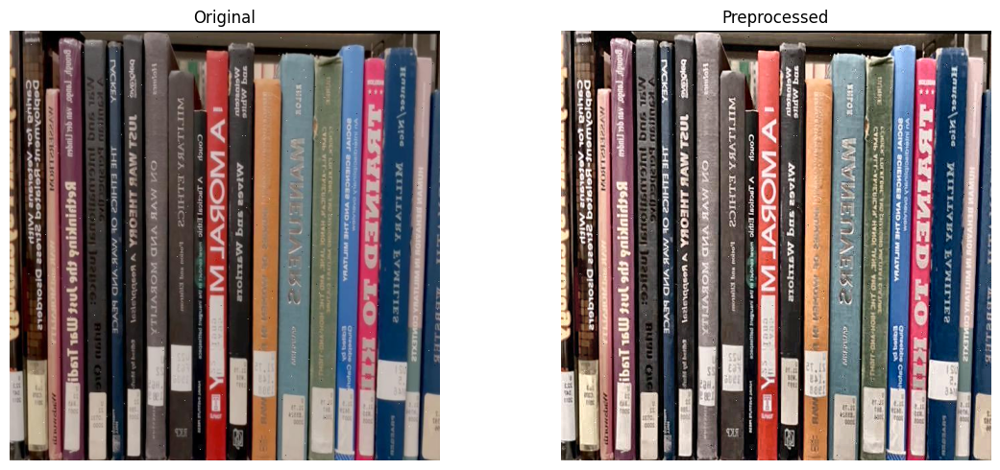

In [289]:
# Utility per test rapido
def test_preprocessor():
	"""Test del preprocessor su un'immagine di esempio"""
	config  = RecognitionConfig()
	preprocessor = ImagePreprocessor(config)

	img_orig = cv2.imread("./dataset/scenes/scene_0.jpg")
	gray_proc = preprocessor.apply_filter(img_orig)
	
	fig, axes = plt.subplots(1, 2, figsize=(12, 5))
	axes[0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
	axes[0].set_title("Original")
	axes[0].axis('off')
	
	axes[1].imshow(cv2.cvtColor(gray_proc, cv2.COLOR_BGR2RGB))
	axes[1].set_title(f"Preprocessed")
	axes[1].axis('off')
	
	plt.tight_layout()
	plt.show()
	
test_preprocessor()

### **Extractor Class**

The **`Extractor`** class is responsible for identifying interest points (**Keypoints**) and computing their mathematical representations (**Descriptors**). It serves as the core "feature engine," transforming the pre-processed pixels into a set of unique fingerprints used for matching.

#### Key Features:

* **Dual-Algorithm Support**: Dynamically instantiates either **SIFT** (Scale-Invariant Feature Transform) or **AKAZE** based on the global configuration, allowing for easy benchmarking between different detection philosophies.

* **RootSIFT Transformation**: When using SIFT, the class implements the **RootSIFT** post-processing technique. By applying  normalization and a square root to the descriptors, it maps them into a space where Euclidean distance approximates the Hellinger distance—drastically improving matching performance by reducing the impact of high-magnitude bins.

* **Fine-tuned Detection**: Leverages the `RecognitionConfig` parameters to control feature density. It specifically manages contrast and edge thresholds to ensure that keypoints are concentrated on relevant typographic details rather than image noise.

* **Diagnostic Visualization**: Provides a utility to render "rich" keypoints (showing scale and orientation), allowing for immediate visual verification of whether the algorithm is correctly focusing on the unique elements of the book covers.

In [290]:
class Extractor:
    def __init__(self, config: RecognitionConfig):
        self.cfg = config
        self.detector = cv2.SIFT_create(
            nfeatures=self.cfg.nfeatures,
            contrastThreshold=self.cfg.contrast_threshold,
            edgeThreshold=self.cfg.edge_threshold,
            nOctaveLayers=4,
        )

    def extract(self, img):
        if img is None: return [], None
        kp, des = self.detector.detectAndCompute(img, None)
        if des is None: return kp, None
        des = des.astype(np.float32)
        if self.cfg.use_root_sift:
            eps = 1e-7
            des /= des.sum(axis=1, keepdims=True) + eps
            des = np.sqrt(des)
        return kp, des

In [294]:
config = RecognitionConfig()

preprocessor = ImagePreprocessor(config=config)
img = cv2.imread("./dataset/scenes/scene_0.jpg")
gray_img = preprocessor.apply_filter(img)

extractor = Extractor(config=config)
keypoints, descriptors = extractor.extract(gray_img)
print(f"Extracted {len(keypoints)} keypoints and descriptors shape: {descriptors.shape if descriptors is not None else 'None'}")


Extracted 8372 keypoints and descriptors shape: (8372, 128)


## StarModelRecognizer (Generalized Hough Transform)

The **`StarModelRecognizer`** is an alternative "orchestrator" based on the **Implicit Shape Model** (Star Model). Instead of iteratively searching and "peeling" keypoints, it uses a **voting strategy** to find multiple object instances simultaneously.

### **Functional Overview**

#### 1. Model Learning (Offline)
For each book template, we:
* Define its **center** (centroid).
* For every SIFT keypoint, calculate a **displacement vector** from the point to the center.
* Store this vector in a **local coordinate system** (normalized by the keypoint's scale and orientation). This ensures the model is rotation and scale invariant.

#### 2. Hough Voting (Online)
When processing a scene:
* For Every Match $(k_t, k_s)$ between template and scene:
	* We use the stored vector of $k_t$ and the actual scale/orientation of $k_s$ to **vote** for a potential object center in the scene.
* Votes are accumulated in a **2D Hough Space** (binned accumulator).

#### 3. Peak Detection & Verification
* Dense clusters in the Hough space represent high-probability object hypotheses.
* For each cluster (peak), we:
	* Collect all matches that contributed to it.
	* Perform **Homography Estimation** (RANSAC) on this specific subset of matches.
	* Use the `GeometryValidator` to confirm if the projected box is realistic.

**Advantages**: This approach is naturally robust to occlusion and can find multiple identical books in a single pass without the "order dependency" of iterative peeling.


### Preliminary Approach: The Discarded `LibrarySegmenter`

Before settling on the current iterative architecture, we explored a pre-segmentation strategy using a dedicated **`LibrarySegmenter`** class. This module was designed to isolate individual book spines before any feature extraction took place.

Technically, it relied on a "top-down" classical pipeline:

* **Sobel Gradients & Morphology**: Used to emphasize long vertical edges and filter out horizontal noise (like text or shelf lines).
* **Column Profiling**: Aggregated pixel intensities into a 1D signal to find "peaks" corresponding to book gaps.
* **Automated Deskewing**: Leveraged gradient energy to automatically rotate shelves that weren't perfectly aligned.
* **Oblique Line Regression**: Used linear regression on edge points to handle tilted books.

**Why it was discarded:** Although the logic was conceptually sound, it proved to be a "naive" bottleneck. The **computational overhead** required to process gradients and morphological filters across the entire image made the code significantly slower. Furthermore, the accuracy gains were minimal compared to the **Iterative Recognizer**, which handles overlapping or tilted books more naturally through keypoint "peeling" without the need for rigid pre-segmentation.

In [295]:
class StarModel:
    """
    Core logic for model registration and Generalized Hough Transform voting.
    """
    def __init__(self, config: RecognitionConfig):
        self.cfg = config
        self.templates = {}
        self.bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

    def add_model(self, book_id: str, kp, des, shape):
        h, w = shape[:2]
        center = (w / 2.0, h / 2.0)
        vectors = []
        for k in kp:
            angle = np.deg2rad(k.angle)
            cos_a, sin_a = np.cos(angle), np.sin(angle)
            dx, dy = center[0] - k.pt[0], center[1] - k.pt[1]
            dx_l = (dx * cos_a + dy * sin_a) / k.size
            dy_l = (-dx * sin_a + dy * cos_a) / k.size
            vectors.append((dx_l, dy_l))
        self.templates[book_id] = {"kp": kp, "des": des, "vectors": vectors, "shape": shape}

    def match_and_vote(self, kp_scene, des_scene, scene_shape):
        if des_scene is None or len(kp_scene) < self.cfg.min_inliers: return []
        all_found = []
        h_s, w_s = scene_shape[:2]
        bin_size = self.cfg.hough_bin_size
        for book_id, tpl in self.templates.items():
            matches = self._match_descriptors(tpl["des"], des_scene)
            if len(matches) < self.cfg.min_matches_to_verify: continue
            accumulator = defaultdict(int)
            match_votes = []
            for m in matches:
                kp_s = kp_scene[m.trainIdx]
                v_l = tpl["vectors"][m.queryIdx]
                cos_s, sin_s = np.cos(np.deg2rad(kp_s.angle)), np.sin(np.deg2rad(kp_s.angle))
                dx_s = (v_l[0] * cos_s - v_l[1] * sin_s) * kp_s.size
                dy_s = (v_l[0] * sin_s + v_l[1] * cos_s) * kp_s.size
                vx, vy = kp_s.pt[0] + dx_s, kp_s.pt[1] + dy_s
                if 0 <= vx < w_s and 0 <= vy < h_s:
                    bin_idx = (int(vx / bin_size), int(vy / bin_size))
                    accumulator[bin_idx] += 1
                    match_votes.append((bin_idx, m))
            sorted_bins = sorted(accumulator.items(), key=lambda x: x[1], reverse=True)
            detected_polys = []
            for bin_idx, count in sorted_bins:
                if count < self.cfg.min_inliers: continue
                bin_matches = [m for b, m in match_votes if b == bin_idx]
                M, mask, inliers, bbox = self._compute_homography(bin_matches, tpl["kp"], kp_scene, tpl["shape"])
                if bbox is not None and self._validate_geometry(M, bbox, scene_shape):
                    center = np.mean(bbox.reshape(4, 2), axis=0)
                    if not any(cv2.pointPolygonTest(p, tuple(center), False) >= 0 for p in detected_polys):
                        all_found.append({"book_id": book_id, "score": inliers, "bbox": bbox})
                        detected_polys.append(bbox.reshape(4, 2).astype(np.float32))
        return all_found

    def _match_descriptors(self, des_model, des_scene):
        if des_model is None or des_scene is None or len(des_scene) < 2: return []
        matches = self.bf.knnMatch(des_model, des_scene, k=2)
        return [m for m, n in matches if m.distance < self.cfg.lowe_ratio * n.distance]

    def _compute_homography(self, matches, kp_model, kp_scene, model_shape):
        if len(matches) < self.cfg.min_matches_to_verify: return None, None, 0, None
        src_pts = np.float32([kp_model[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        try:
            M, mask = cv2.findHomography(src_pts, dst_pts, self.cfg.ransac_method, self.cfg.ransac_thresh)
        except cv2.error: return None, None, 0, None
        if M is None: return None, None, 0, None
        inliers = int(mask.ravel().sum())
        if inliers < self.cfg.min_inliers: return None, None, inliers, None
        h, w = model_shape[:2]
        corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
        bbox = cv2.perspectiveTransform(corners, M)
        return M, mask, inliers, bbox

    def _validate_geometry(self, H, bbox, scene_shape):
        if H is None or bbox is None: return False
        det = np.linalg.det(H[0:2, 0:2])
        if det < 0 or abs(det) < self.cfg.min_det: return False
        if not cv2.isContourConvex(np.int32(bbox)): return False
        area = cv2.contourArea(bbox)
        if area < self.cfg.min_area or area > (scene_shape[0] * scene_shape[1] * 0.9): return False
        pts = bbox.reshape(4, 2).astype(np.float32)
        def angle_cos(p0, p1, p2):
            d1, d2 = (p0-p1), (p2-p1)
            norm = np.linalg.norm(d1) * np.linalg.norm(d2)
            return abs(np.dot(d1, d2) / (norm + 1e-7))
        for i in range(4):
            p0, p1, p2 = pts[i-1], pts[i], pts[(i+1)%4]
            if angle_cos(p0, p1, p2) > self.cfg.max_cos_diff: return False
        return True


### Main execution Loop

In [296]:
class BookRecognizer:
    """
    Orchestrates the entire pipeline: Load -> Preprocess -> Extract -> Recognize -> Visualize
    """
    def __init__(self, config: RecognitionConfig):
        self.cfg = config
        self.preprocessor = ImagePreprocessor(config=config)
        self.extractor = Extractor(config=config)
        self.star_model = StarModel(config=config)

    def load_library(self, models_dir: str):
        print(f"Indexing models from {models_dir}...")
        count = 0
        for fname in os.listdir(models_dir):
            if fname.lower().endswith((".png", ".jpg", ".jpeg")):
                path = os.path.join(models_dir, fname)
                img = cv2.imread(path)
                if img is not None:
                    book_id = os.path.splitext(fname)[0]
                    gray = self.preprocessor.apply_filter(img)
                    kp, des = self.extractor.extract(gray)
                    self.star_model.add_model(book_id, kp, des, gray.shape)
                    count += 1
        print(f"{count} Models indexed successfully.")

    def run_on_scenes(self, scenes_dir: str):
        scene_files = sorted([f for f in os.listdir(scenes_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))])
        print(f"Analyzing {len(scene_files)} scenes...")
        for scene_file in scene_files:
            scene_path = os.path.join(scenes_dir, scene_file)
            print(f"\nProcessing: {scene_file}...")
            scene_img = cv2.imread(scene_path)
            if scene_img is None: continue
            gray_scene = self.preprocessor.apply_filter(scene_img)
            kp_scene, des_scene = self.extractor.extract(gray_scene)
            results = self.star_model.match_and_vote(kp_scene, des_scene, gray_scene.shape)
            self._visualize(scene_img, results, scene_file)

    def _visualize(self, scene_img, results, scene_name):
        vis_img = scene_img.copy()
        np.random.seed(42) 
        colors = np.random.randint(0, 255, (len(results) + 1, 3)).tolist()
        for i, res in enumerate(results):
            bbox = np.int32(res["bbox"])
            color = colors[i]
            cv2.polylines(vis_img, [bbox], True, color, 4)
            label = f"{res['book_id']} ({res['score']})"
            (w_text, h_text), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
            pts = bbox.reshape(-1, 2)
            idx_top = np.argmin(pts[:, 1])
            x, y = pts[idx_top]
            cv2.rectangle(vis_img, (x, y - h_text - 10), (x + w_text, y), color, -1)
            cv2.putText(vis_img, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
        plt.figure(figsize=(10, 6)); plt.imshow(cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Star Model Detection: {scene_name}"); plt.axis('off'); plt.show()
        for res in results: print(f" -> Found {res['book_id']} ({res['score']} inliers)")


Indexing models from ./dataset/models/...
22 Models indexed successfully.
Analyzing 30 scenes...

Processing: scene_0.jpg...


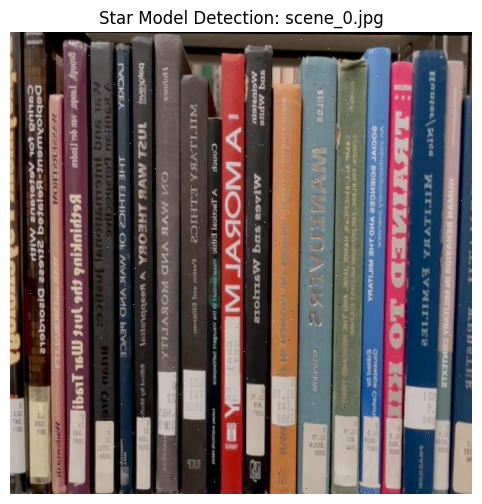


Processing: scene_1.jpg...


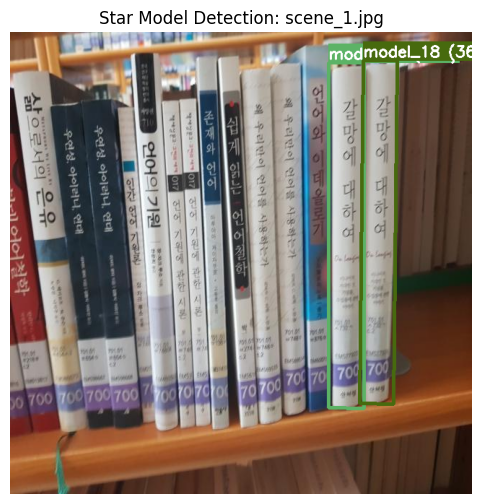

 -> Found model_18 (107 inliers)
 -> Found model_18 (36 inliers)

Processing: scene_10.jpg...


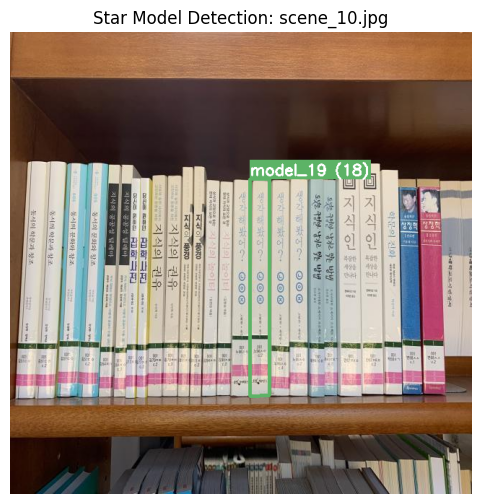

 -> Found model_19 (18 inliers)

Processing: scene_11.jpg...


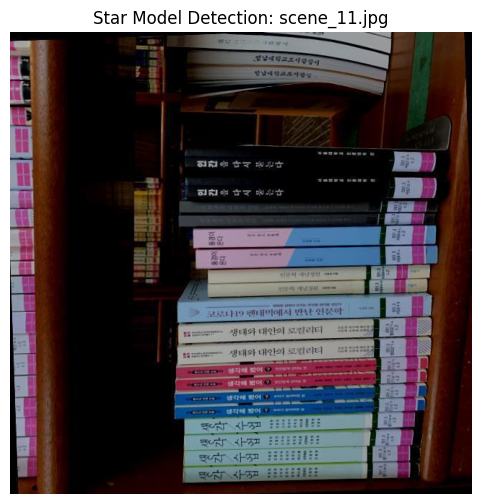


Processing: scene_12.jpg...


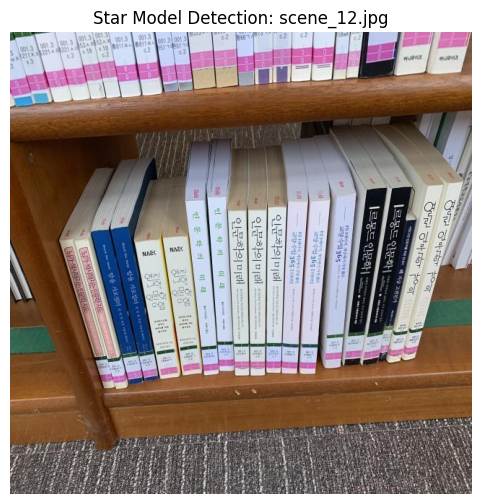


Processing: scene_13.jpg...


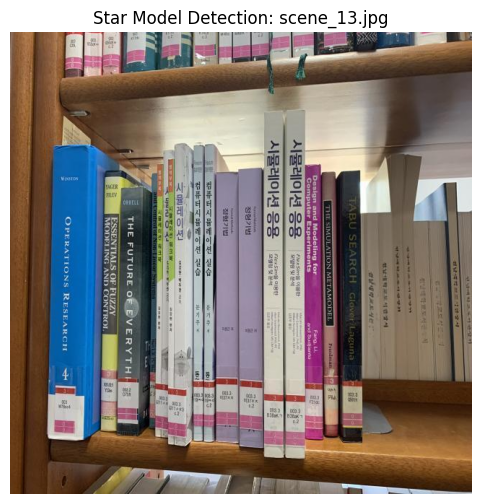


Processing: scene_14.jpg...


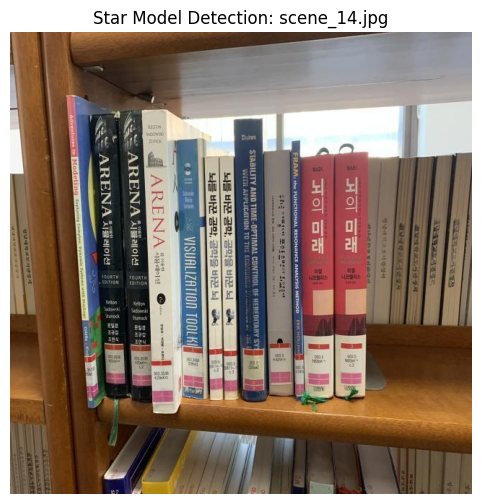


Processing: scene_15.jpg...


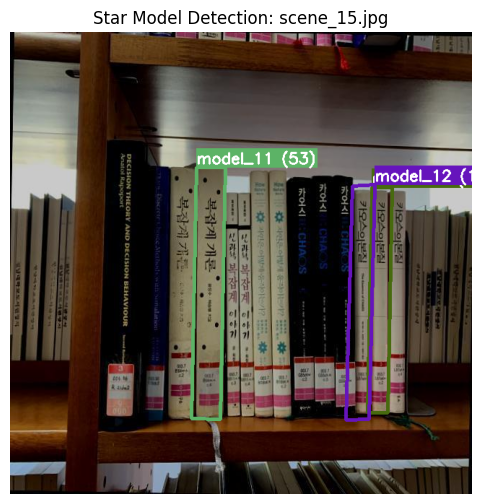

 -> Found model_11 (53 inliers)
 -> Found model_12 (33 inliers)
 -> Found model_12 (11 inliers)

Processing: scene_16.jpg...


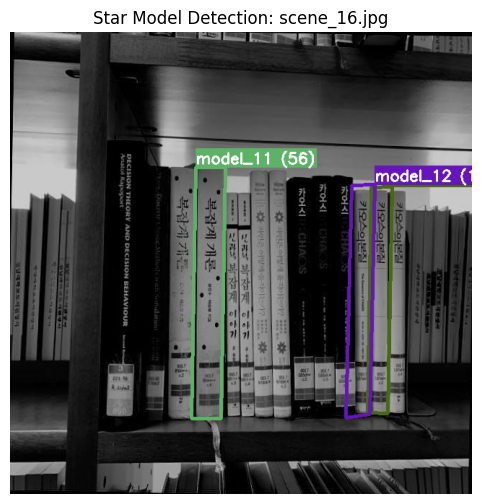

 -> Found model_11 (56 inliers)
 -> Found model_12 (31 inliers)
 -> Found model_12 (10 inliers)

Processing: scene_17.jpg...


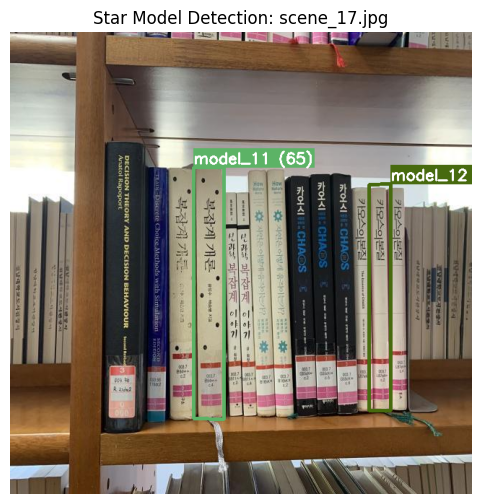

 -> Found model_11 (65 inliers)
 -> Found model_12 (46 inliers)

Processing: scene_18.jpg...


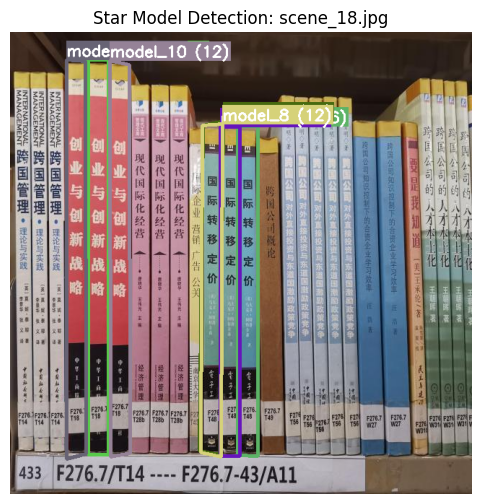

 -> Found model_9 (56 inliers)
 -> Found model_9 (12 inliers)
 -> Found model_8 (44 inliers)
 -> Found model_8 (12 inliers)
 -> Found model_10 (46 inliers)
 -> Found model_10 (14 inliers)
 -> Found model_10 (12 inliers)

Processing: scene_19.jpg...


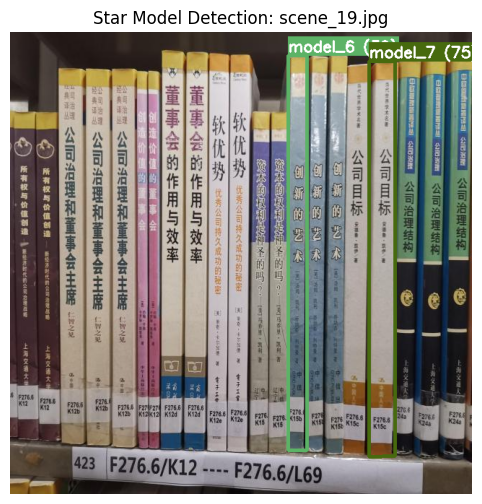

 -> Found model_6 (39 inliers)
 -> Found model_7 (75 inliers)

Processing: scene_2.jpg...


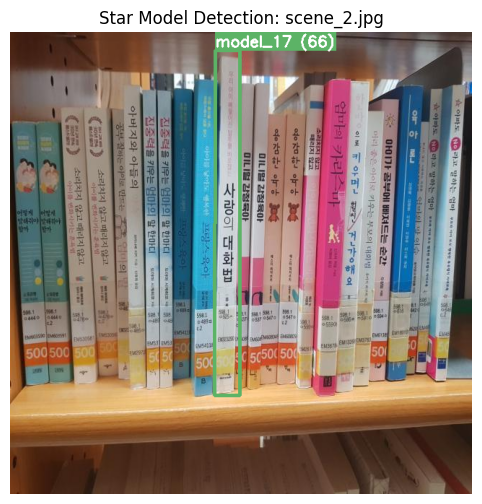

 -> Found model_17 (66 inliers)

Processing: scene_20.jpg...


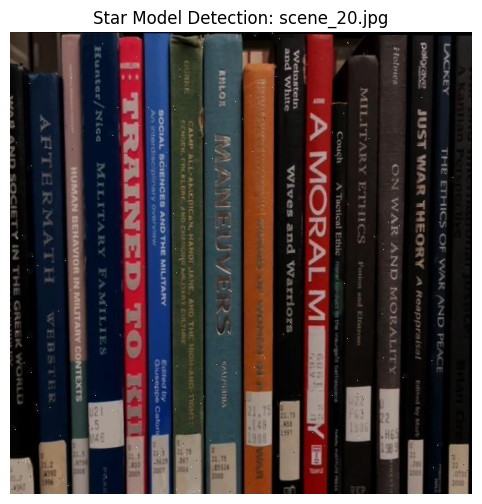


Processing: scene_21.jpg...


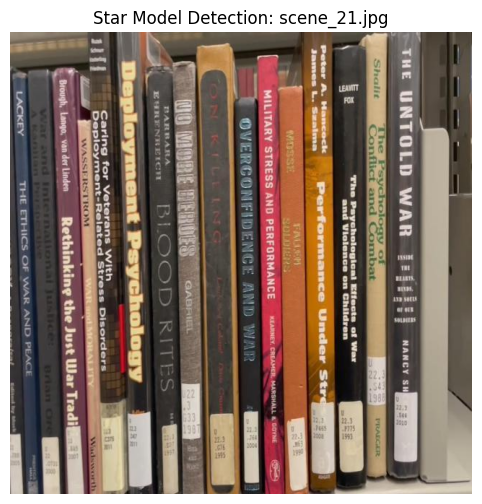


Processing: scene_22.jpg...


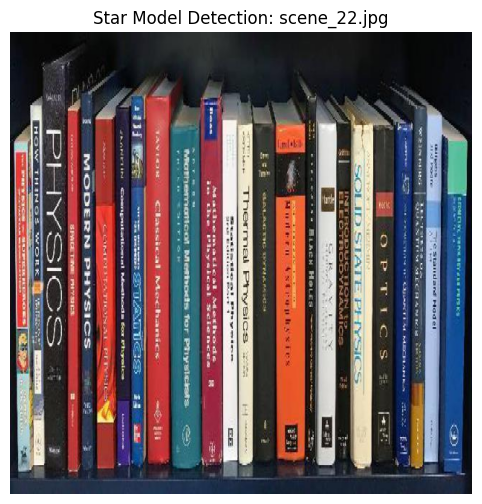


Processing: scene_23.jpg...


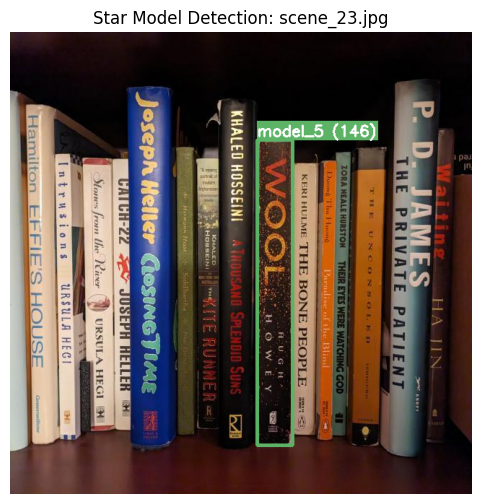

 -> Found model_5 (146 inliers)

Processing: scene_24.jpg...


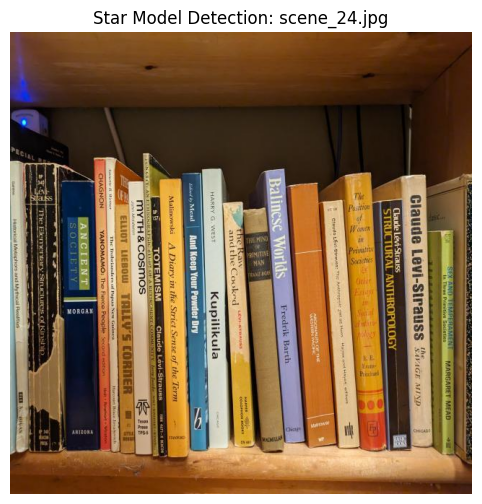


Processing: scene_25.jpg...


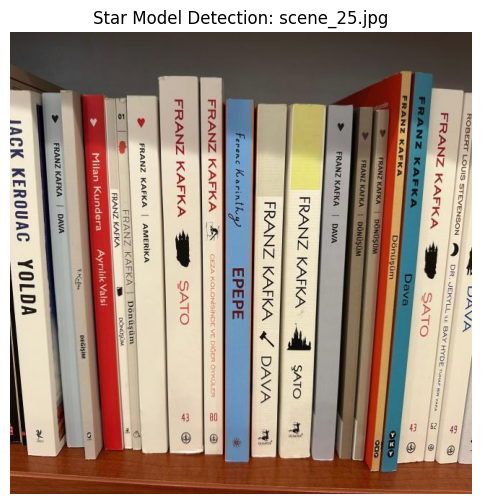


Processing: scene_26.jpg...


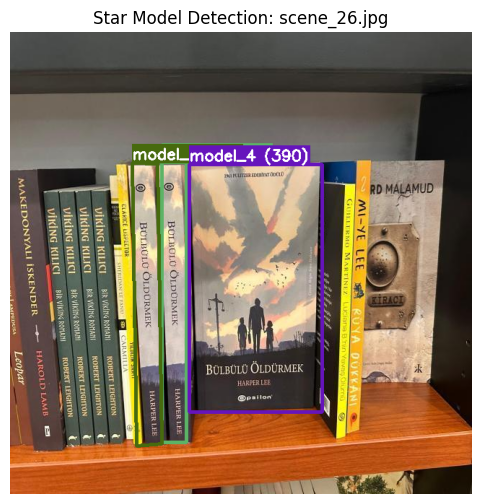

 -> Found model_0 (58 inliers)
 -> Found model_0 (18 inliers)
 -> Found model_4 (390 inliers)

Processing: scene_27.jpg...


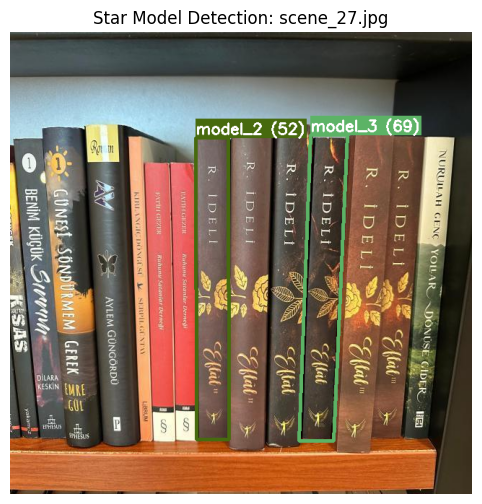

 -> Found model_3 (69 inliers)
 -> Found model_2 (52 inliers)

Processing: scene_28.jpg...


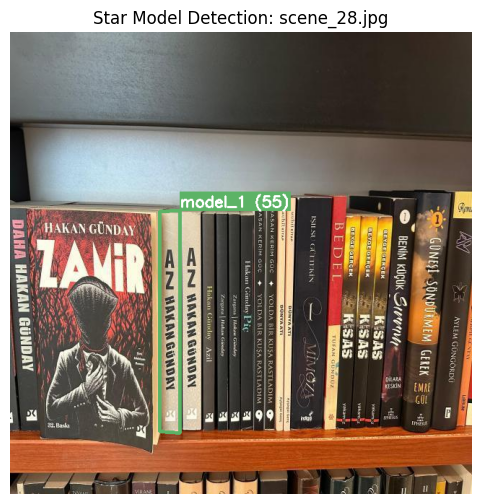

 -> Found model_1 (55 inliers)

Processing: scene_3.jpg...


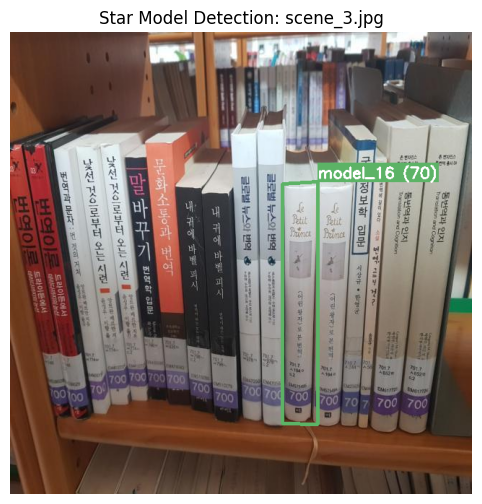

 -> Found model_16 (70 inliers)

Processing: scene_300.jpg...


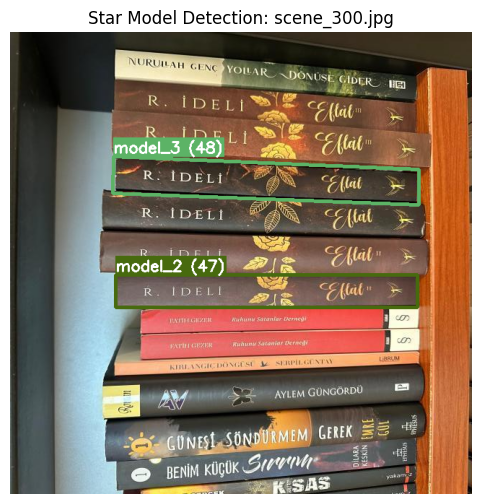

 -> Found model_3 (48 inliers)
 -> Found model_2 (47 inliers)

Processing: scene_4.jpg...


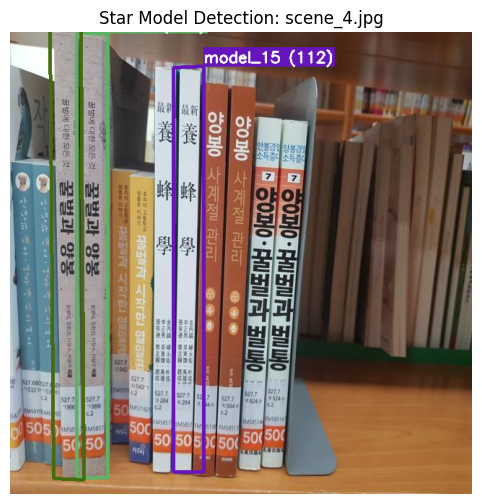

 -> Found model_14 (197 inliers)
 -> Found model_14 (37 inliers)
 -> Found model_15 (112 inliers)

Processing: scene_5.jpg...


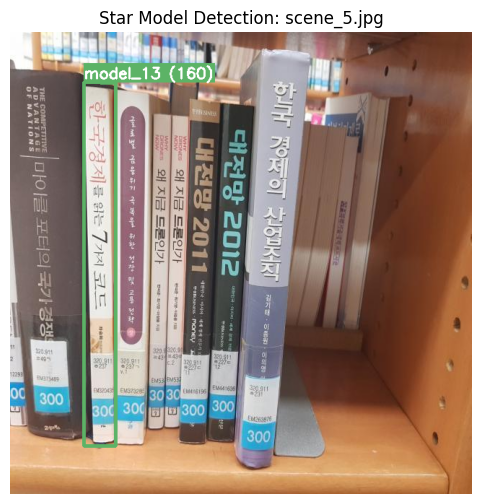

 -> Found model_13 (160 inliers)

Processing: scene_6.jpg...


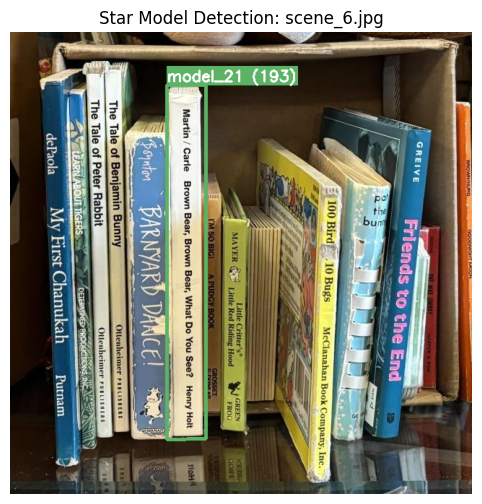

 -> Found model_21 (193 inliers)

Processing: scene_7.jpg...


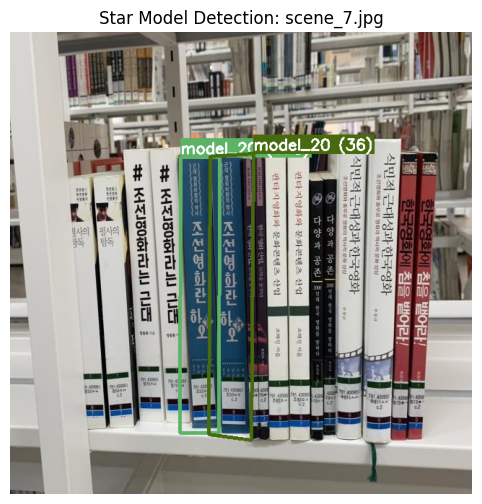

 -> Found model_20 (178 inliers)
 -> Found model_20 (36 inliers)

Processing: scene_8.jpg...


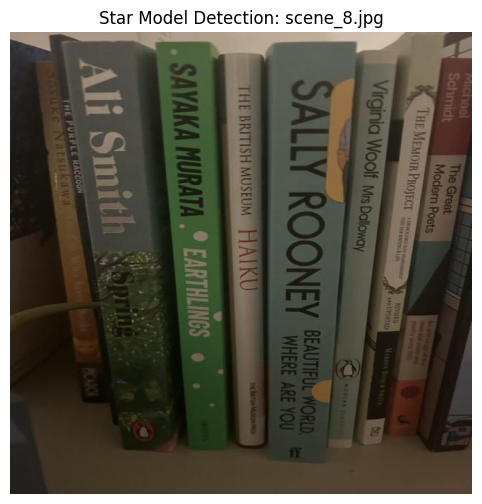


Processing: scene_9.jpg...


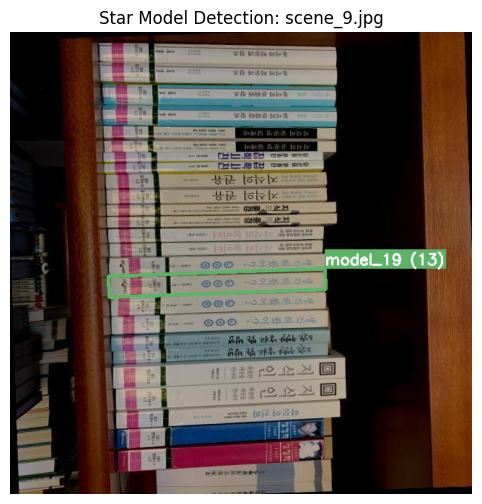

 -> Found model_19 (13 inliers)


In [297]:
config = RecognitionConfig()
recognizer = BookRecognizer(config=config)
recognizer.load_library("./dataset/models/")
recognizer.run_on_scenes("./dataset/scenes/")

### Final Considerations and Performance Insights

In conclusion, the **`StarModelRecognizer`** (Implicit Shape Model) provides a robust framework for multi-object detection. By leveraging the **Generalized Hough Transform**, the system effectively clusters feature matches that are spatially consistent with the template's geometry, significantly reducing false positives before RANSAC even begins.

A key strength of this architecture is its **rotational and scale invariance**. The transformation of displacement vectors into the local coordinate system of SIFT keypoints ensures that books can be detected regardless of their orientation on the shelf. The pipeline remains highly stable across varied scenes, maintaining precision and geometric consistency even in cluttered environments.
